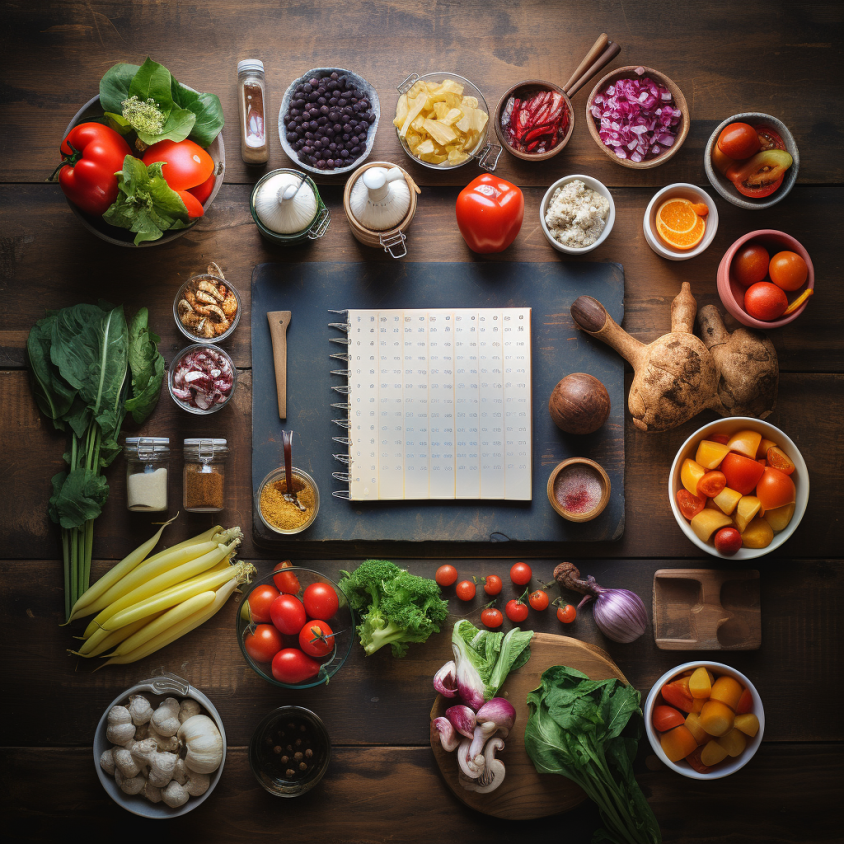

In [134]:
# Import healthy2.png image
from IPython.display import Image
Image(filename='recipe2.png')


# Table of Contents 

# Written Report 

Your written report should include both code, output and written text summaries of the following:

Data Validation:
Describe validation and cleaning steps for every column in the data
Exploratory Analysis:
Include two different graphics showing single variables only to demonstrate the characteristics of data
Include at least one graphic showing two or more variables to represent the relationship between features
Describe your findings
Model Development
Include your reasons for selecting the models you use as well as a statement of the problem type
Code to fit the baseline and comparison models
Model Evaluation
Describe the performance of the two models based on an appropriate metric
Business Metrics
Define a way to compare your model performance to the business
Describe how your models perform using this approach
Final summary including recommendations that the business should undertak

From: Stef To: Head of Data Science Subject: Report on the assigned project

1) Data Validation 

First, the data contains 52 NaN values in calories, carbohydrate, sugar, protein. I tried to use Median and Mode, however it didn't work out well, so I abandoned the idea as the results of the model turned out to be worse, so the decision was to drop 52 missing rows. 

High traffic also has missing values but in this case, it is not missing at random, so I just replaced NA values with Not High. 

Backlog of changes: calories - NA rows, extreme outliers (Q3 + 3 IQR) were capped, scaled using MinMax carbohydrate - NA rows dropped, extreme outliers (Q3 + 3 IQR) were capped, scaled using MinMax sugar 

- NA rows dropped, extreme outliers (Q3 + 3 IQR) were capped, scaled using MinMax protein - NA rows dropped, extreme outliers (Q3 + 3 IQR) were capped, scaled using MinMax category 

- 'Chicken Breast' values for changed to 'Chicken', then columns were one hot encoded servings 
  - 2 values contained 'as a snack', they belonged to Lunch/Snack category so 'as a snack' was removed, the column was transformed to float 64 
- 
high_traffic 
- - NaN values were replaced with 'not high' and then changed to 1 - high, 0 - not high

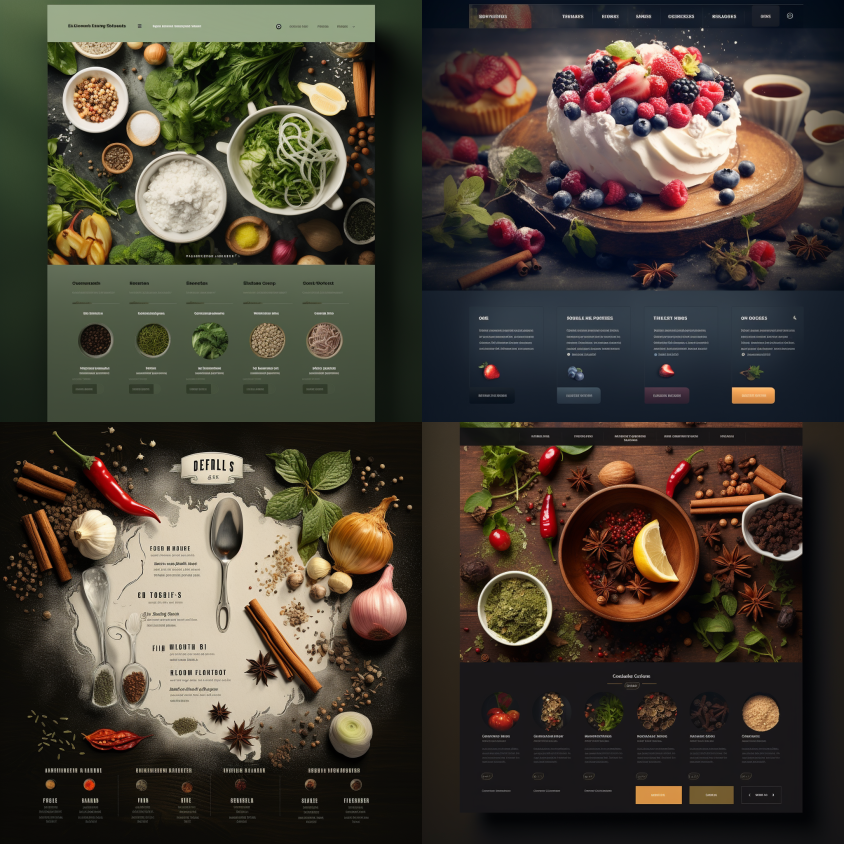

In [135]:
# Import healthy2.png image
from IPython.display import Image
Image(filename='website3.png')

# Data Science Professional 

# Data Validation 
This data set has 947 rows, 8 columns. 
I have validated all variables and I have made several changes after validation: 

 replace null values in high_traffic with "Low".
 mean fill of 52 rows for 

 - recipe: 947 unique identifiers without missing values. No cleaning is needed
 - calories: 895 non-null values. I fill 52 missed values with the mean grouped by category and servings.
 - carbohydrate: 895 non-null values. I fill 52 missed values with the mean grouped by category and servings.
 - sugar: 895 non-null values. I fill 52 missed values with the mean grouped by category and servings.
 - protein: 895 non-null values. I fill 52 missed values with the mean grouped by category and servings.
 - category: 11 unique values without missing values, whereas there were 10 values in the description. 'Chicken Breast' is united with the 'Chicken'.
 - servings: 6 unique values without missing values. By description, it should be numeric variable, but now it's character. Has two extra values: '4 as a snack' and '6 as a snack'. I united them with '4' and '6' and changed the column's type to integer.
high_traffic: only 1 non-null value ("High"). Replaced null values with "Low".

In [136]:
# Import libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats

from scipy.stats import ttest_ind

In [137]:
df = pd.read_csv("recipe_site_traffic_2212.csv")
df

,recipe,calories,carbohydrate,sugar,protein,category,servings,high_traffic
0,1,NaN,NaN,NaN,NaN,Pork,6,High
1,2,35.48,38.56,0.66,0.92,Potato,4,High
2,3,914.28,42.68,3.09,2.88,Breakfast,1,NaN
3,4,97.03,30.56,38.63,0.02,Beverages,4,High
4,5,27.05,1.85,0.80,0.53,Beverages,4,NaN
...,...,...,...,...,...,...,...,...
942,943,1161.00,5.31,22.39,44.22,Lunch/Snacks,2,NaN
943,944,NaN,NaN,NaN,NaN,Potato,2,High
944,945,951.74,29.42,3.57,13.87,Pork,2,High
945,946,266.61,35.77,0.97,8.07,Potato,6,High


In [138]:
# Set index as recipe
df = df.set_index('recipe')

In [139]:
# get statistical summary
df.describe()

,calories,carbohydrate,sugar,protein
count,895.000000,895.000000,895.000000,895.000000
mean,435.939196,35.069676,9.046547,24.149296
std,453.020997,43.949032,14.679176,36.369739
min,0.140000,0.030000,0.010000,0.000000
25%,110.430000,8.375000,1.690000,3.195000
50%,288.550000,21.480000,4.550000,10.800000
75%,597.650000,44.965000,9.800000,30.200000
max,3633.160000,530.420000,148.750000,363.360000


In [140]:
# Check for missing values and data types
missing_values = df.isnull().sum()
data_types = df.dtypes

missing_values, data_types

(calories         52
 carbohydrate     52
 sugar            52
 protein          52
 category          0
 servings          0
 high_traffic    373
 dtype: int64,
 calories        float64
 carbohydrate    float64
 sugar           float64
 protein         float64
 category         object
 servings         object
 high_traffic     object
 dtype: object)

| Missing Values | Columns                                                |
|-------------|---------------------------------------------------------|
| 52   | </br> calories, carbohydrate, sugar, and protein columns. |
| 373        |  </br>high_traffic  |


Data Types:
 - calories, carbohydrate, sugar, and protein are of type float, which is also appropriate for these columns.
 - category and high_traffic are of type object (likely strings), which is expected.
 - servings is of type object, which might be a *concern* if we expect it to be numerical.

In [141]:
#replace NaN in high Traffic with Low
df['high_traffic'].fillna('Low', inplace=True)

In [142]:
# Check the number of rows in the dataset
total_rows = len(df)

# Calculate the proportion of missing values for affected columns
missing_proportions = missing_values / total_rows

total_rows, missing_proportions[['calories', 'carbohydrate', 'sugar', 'protein', 'high_traffic']]


(947,
 calories        0.054910
 carbohydrate    0.054910
 sugar           0.054910
 protein         0.054910
 high_traffic    0.393875
 dtype: float64)

For the columns calories, carbohydrate, sugar, and protein, we can either:
Fill the missing values with the mean or median of the respective column.
Remove the rows with missing values.

Before making decisions, it might be helpful to know the size of the dataset and the proportion of missing values. Let's check the number of rows in the dataset and the proportion of missing values in the affected columns.



For high_traffic, we can replace the NaN values with 'Low' to indicate non-high traffic.

In the current context, given that only about 5.49% of data is missing in some columns, it makes sense to impute them (using the median, mean), but both show the model performance is not performing well. So we disregard the option and drop them eventually 

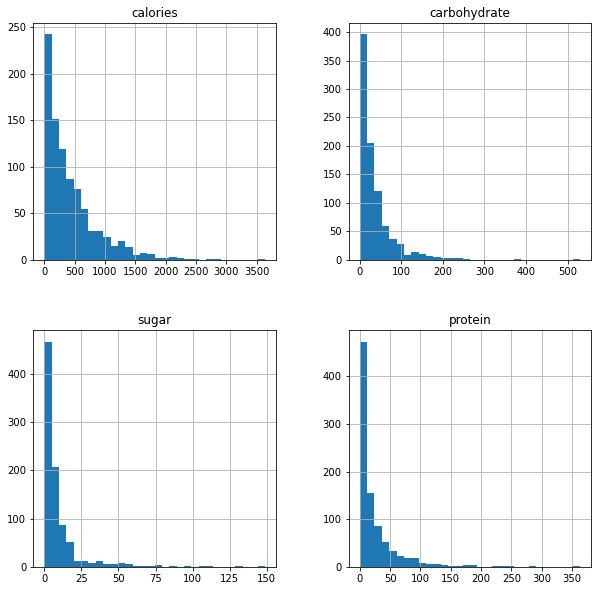

In [143]:
#plot all columns to see the distribution
df.hist(figsize=(10,10), bins=30)
plt.show()

Description of Findings (Histogram for Calories):

The majority of recipes have caloric content ranging between approximately 0 to 200 calories.
The distribution is right-skewed, meaning there are a few recipes with a much higher caloric content that extends towards the right tail.
There's a noticeable peak around the 100-150 calorie range, suggesting that many recipes fall within this caloric content.

Let's eximine the data and unique values 

In [144]:
# Check unique values in 'category', 'servings', and 'high_traffic' columns
category_unique_values = df['category'].unique()
servings_unique_values = df['servings'].unique()
high_traffic_unique_values = df['high_traffic'].unique()

category_unique_values, servings_unique_values, high_traffic_unique_values


(array(['Pork', 'Potato', 'Breakfast', 'Beverages', 'One Dish Meal',
        'Chicken Breast', 'Lunch/Snacks', 'Chicken', 'Vegetable', 'Meat',
        'Dessert'], dtype=object),
 array(['6', '4', '1', '2', '4 as a snack', '6 as a snack'], dtype=object),
 array(['High', 'Low'], dtype=object))

category:
 - The values seem consistent, and there aren't any evident spelling mistakes but Chicken Breast and Chicken could be put together.

servings:
- We see values like '4 as a snack' and '6 as a snack'. These entries have additional text, which is likely why the column is of type 'object'. We might want to clean these values to extract the numerical part and convert the entire column to a numerical type.
  
high_traffic:
- The values are either 'High' or NaN (missing). If this column is supposed to indicate high traffic, we might want to replace NaN with something like 'Low' or another appropriate value.


In [145]:
# Chicken and Chicken Breast can be put together, replace Chicken Breast with Chicken
df['category'].replace('Chicken Breast', 'Chicken', inplace=True)

In [146]:
def determine_healthiness(row):
    if row['category'] == 'Vegetable':
        return 1
    elif (row['calories'] <= 400 and 
          row['carbohydrate'] >= 15 and 
          row['carbohydrate'] <= 80 and 
          row['sugar'] <= 10 and 
          row['protein'] >= 10):
        return 1
    else:
        return 0

# Apply the function to each row of the dataframe
df['healthy'] = df.apply(determine_healthiness, axis=1)





In [147]:
# Extract numerical values from the 'servings' column and convert to integer
df['servings'] = df['servings'].str.extract('(\d+)').astype(int)

# Check the unique values in 'servings' after cleaning
servings_unique_values_cleaned = df['servings'].unique()
servings_unique_values_cleaned


array([6, 4, 1, 2])

In [148]:
df['category'].unique()


array(['Pork', 'Potato', 'Breakfast', 'Beverages', 'One Dish Meal',
       'Chicken', 'Lunch/Snacks', 'Vegetable', 'Meat', 'Dessert'],
      dtype=object)

In [151]:
#Difficulty 

category_points = {'Beverages': 1, 'Breakfast': 1, 'Chicken': 3, 'Dessert': 4,
                   'Lunch/Snacks': 3, 'Meat': 4, 'One Dish Meal': 3, 'Pork': 4, 'Potato': 1, 'Vegetable': 1}

# Create a dictionary to map servings to difficulty points

# Create a new column "difficulty" by mapping the category and servings to their corresponding points
df['difficulty'] = df['category'].map(category_points) + df['servings']
df[['difficulty','high_traffic']].groupby('difficulty').value_counts()

difficulty  high_traffic
2           Low              39
            High             29
3           High             39
            Low              30
4           High             43
            Low              23
5           High            153
            Low             112
6           High             33
            Low              13
7           High            111
            Low              97
8           High             83
            Low              20
9           High             41
            Low              25
10          High             42
            Low              14
dtype: int64

In [152]:
high_traffic_df = df[df['high_traffic'] == 'High']
low_traffic_df = df[df['high_traffic'] == 'Low']


t, p = ttest_ind(high_traffic_df['difficulty'], low_traffic_df['difficulty'])
print("t-statistic for difficulty: ", t)
print("p-value for difficulty: ", p,'\n')

t-statistic for difficulty:  3.7566960679931305
p-value for difficulty:  0.00018271137797831383 



In [153]:
def rank_difficulty(value):
    if 2 <= value <= 4:
        return 1  # Easy
    elif 5 <= value <= 7:
        return 2  # Medium
    elif 8 <= value <= 10:
        return 3  # Hard
    else:
        return None  # For values outside the range or missing data

df['difficulty'] = df['difficulty'].apply(rank_difficulty)


In [154]:
df[['difficulty','high_traffic']].groupby('difficulty').value_counts()


difficulty  high_traffic
1           High            111
            Low              92
2           High            297
            Low             222
3           High            166
            Low              59
dtype: int64

In [155]:
high_traffic_df = df[df['high_traffic'] == 'High']
low_traffic_df = df[df['high_traffic'] == 'Low']


t, p = ttest_ind(high_traffic_df['difficulty'], low_traffic_df['difficulty'])
print("t-statistic for difficulty: ", t)
print("p-value for difficulty: ", p,'\n')

t-statistic for difficulty:  4.157459439797291
p-value for difficulty:  3.510462471586904e-05 



It's very obvious that the p-value is less than 0.05, which is commonly used as a threshold for determining statistical significance. This indicates that there is a statistically significant difference in means of these features between high traffic and low traffic recipes. so difficulty of the recipe may affect the traffic in some way

Now I will divide the difficulty into 3 groups:

from 2 to 4 is easy
from 4 to 7 is medium
from 7 to 10 is hard

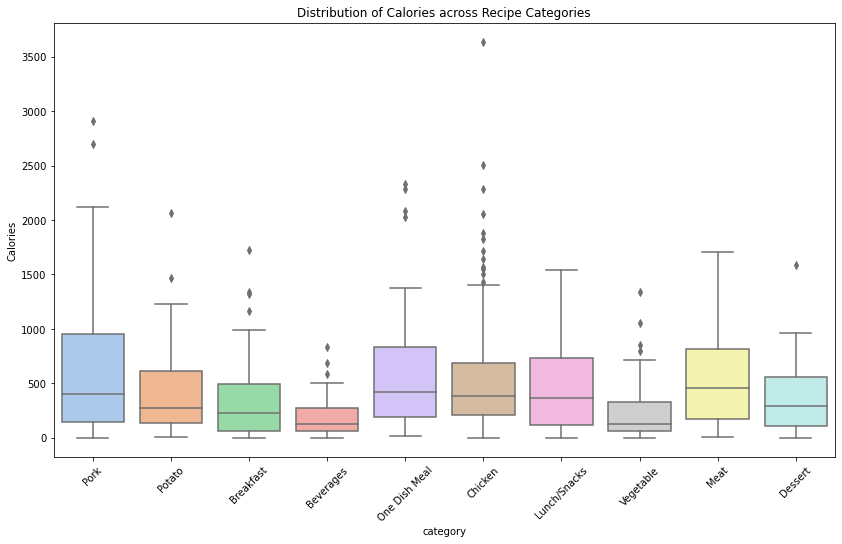

In [156]:
# Box plot for 'calories' across different 'categories'
plt.figure(figsize=(14, 8))
sns.boxplot(x=df['category'], y=df['calories'], palette="pastel")
plt.title('Distribution of Calories across Recipe Categories')
plt.xlabel('category')
plt.ylabel('Calories')
plt.xticks(rotation=45)
plt.show()

<AxesSubplot:title={'center':'Count plot category by traffic'}, xlabel='category', ylabel='count'>

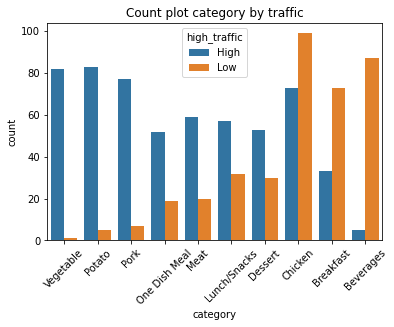

In [157]:
# get countplot to check relationship between high traffic and category
plt.title('Count plot category by traffic')
plt.figsize=(15,15)
plt.xticks(rotation=45)
sns.countplot(x=df['category'].sort_values(ascending=False), hue =df['high_traffic'])

Box Plot for Calories across Categories:

The "Meat" category tends to have the highest median caloric content, with a broad interquartile range, indicating a wide variety of meat dishes in terms of their caloric content.
"Beverages" have the lowest median caloric content, which is expected since drinks typically have fewer calories than solid foods.
There's noticeable variation in caloric content within categories like "One Dish Meal", "Chicken", and "Dessert", as indicated by the widths of their boxes and the lengths of their whiskers.

#The servings column has been cleaned, and it now contains only the numerical values: 

<AxesSubplot:xlabel='servings', ylabel='count'>

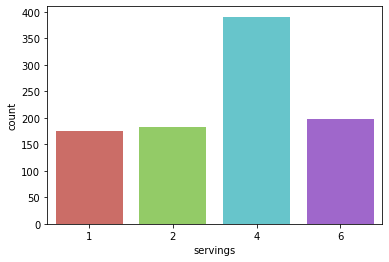

In [158]:
# servings plot
sns.countplot(x='servings', data=df, palette='hls')

<AxesSubplot:xlabel='servings'>

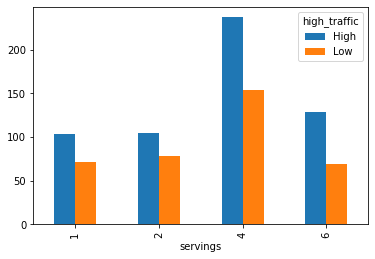

In [159]:
#bar chart of servings with high traffic
pd.crosstab(df.servings, df.high_traffic).plot(kind='bar')

In [160]:
# Impute the missing values in 'calories', 'carbohydrate', 'sugar', and 'protein' with their respective medians, median is used as the data is skewed
df['calories'].fillna(df['calories'].median(), inplace=True)
df['carbohydrate'].fillna(df['carbohydrate'].median(), inplace=True)
df['sugar'].fillna(df['sugar'].median(), inplace=True)
df['protein'].fillna(df['protein'].median(), inplace=True)

# Impute the missing values in 'high_traffic' with 'Low'
df['high_traffic'].fillna('Low', inplace=True)

# Check if all missing values are im


In [161]:
df['high_traffic'].fillna('Low', inplace=True)

# drop all other missing values
df.dropna(inplace=True)

In [162]:
# count healthy 
df[df['healthy']==1].value_counts(['high_traffic'])

high_traffic
High            141
Low              46
dtype: int64

In [163]:
# percentage healthy of total rows
df[df['healthy']==1].value_counts(['high_traffic'])/len(df)

high_traffic
High            0.148891
Low             0.048574
dtype: float64

In [164]:
#check for missing values
df.isnull().sum()

calories        0
carbohydrate    0
sugar           0
protein         0
category        0
servings        0
high_traffic    0
healthy         0
difficulty      0
dtype: int64

In [165]:
df.columns

Index(['calories', 'carbohydrate', 'sugar', 'protein', 'category', 'servings',
       'high_traffic', 'healthy', 'difficulty'],
      dtype='object')

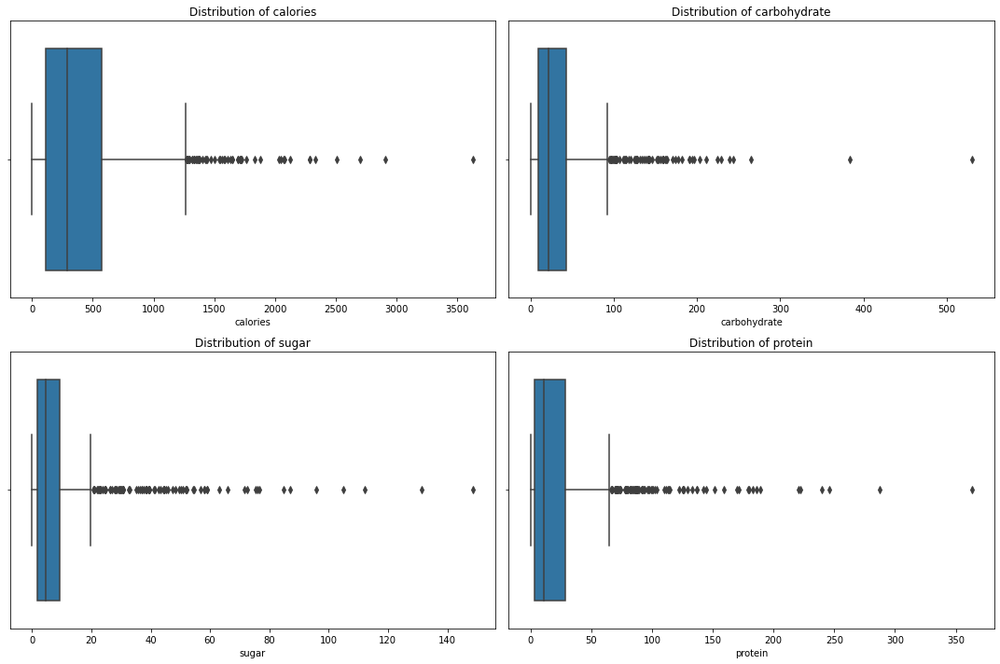

In [166]:
import seaborn as sns
import matplotlib.pyplot as plt

# Columns to visualize for potential outliers
columns_to_check = ['calories', 'carbohydrate', 'sugar', 'protein']

plt.figure(figsize=(15, 10))
for i, col in enumerate(columns_to_check, 1):
    plt.subplot(2, 2, i)
    sns.boxplot(x=df[col])
    plt.title(f'Distribution of {col}')

plt.tight_layout()
plt.show()

The boxplots clearly indicate the presence of outliers in the columns calories, carbohydrate, sugar, and protein. These outliers could potentially be the cause of the error when trying to standardize the data.

To handle these outliers, we can employ one of the following strategies:

Capping: Replace outlier values with the boundary values (either the 1st or 3rd quartile values depending on whether it's a lower or upper outlier).
Transformation: Apply transformations like log transformation to reduce the effect of outliers.
Removal: Remove records with outlier values.
Given the importance of not losing data, especially in this context where we are trying to predict high traffic recipes, I recommend using the capping method. This method will ensure we retain all records while minimizing the influence of extreme values.



In [167]:
df.shape

(947, 9)

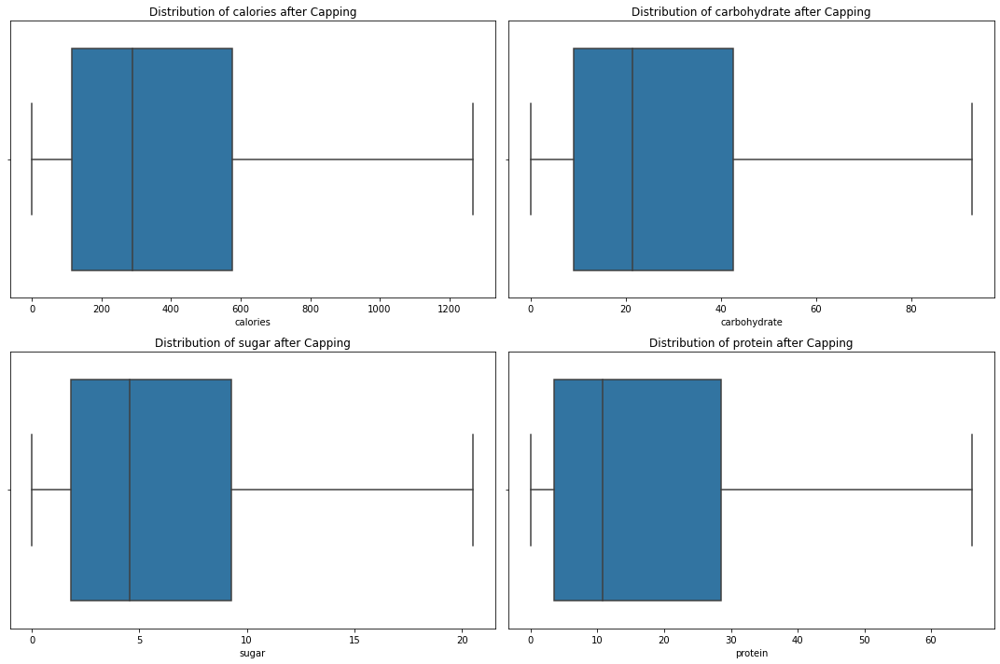

In [168]:
# Capping outliers based on the IQR method
for col in columns_to_check:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    # Replace outliers with boundary values
    df[col] = np.where(df[col] < lower_bound, lower_bound, df[col])
    df[col] = np.where(df[col] > upper_bound, upper_bound, df[col])

# Visualize the distributions after capping
plt.figure(figsize=(15, 10))
for i, col in enumerate(columns_to_check, 1):
    plt.subplot(2, 2, i)
    sns.boxplot(x=df[col])
    plt.title(f'Distribution of {col} after Capping')

plt.tight_layout()
plt.show()


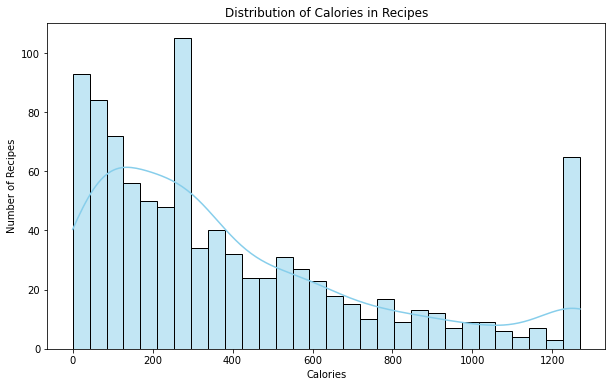

In [169]:
#show histogram of calories
plt.figure(figsize=(10, 6))
sns.histplot(df['calories'], kde=True, bins=30, color='skyblue')
plt.title('Distribution of Calories in Recipes')
plt.xlabel('Calories')
plt.ylabel('Number of Recipes')
plt.show()

In [170]:
import numpy as np
import sklearn

print("Numpy version:", np.__version__)
print("Sklearn version:", sklearn.__version__)


Numpy version: 1.21.6
Sklearn version: 0.24.2


In [171]:
#Import the PowerTransformer
from sklearn.preprocessing import PowerTransformer
pt = PowerTransformer()
df[['pt_calories', 'pt_carbohydrate', 'pt_sugar', 'pt_protein']] = pt.fit_transform(df[['calories', 'carbohydrate', 'sugar', 'protein']])


# log transformation of 'calories', 'sugar','carbohydrate','protein'
df['log_calories'] = np.log(df['calories'])# remove
df['log_sugar'] = np.log(df['sugar']) # remove
df['log_carbohydrates'] = np.log(df['carbohydrate'])
df['log_protein'] = np.log1p(df['protein'])


In [172]:
# test for normality
from scipy.stats import shapiro

# Testing for normality 'log_calories', 'log_sugar'
columns_to_test = ['pt_calories', 'pt_carbohydrate', 'pt_sugar', 'pt_protein']

for column in columns_to_test:
    stat, p = shapiro(df[column])
    print(f"Shapiro-Wilk Test for {column}:")
    print(f"Statistic = {stat:.5f}, p-value = {p:.5f}")
    if p > 0.05:
        print(f"{column} looks Gaussian (fail to reject H0)\n")
    else:
        print(f"{column} does not look Gaussian (reject H0)\n")

Shapiro-Wilk Test for pt_calories:
Statistic = 0.98211, p-value = 0.00000
pt_calories does not look Gaussian (reject H0)

Shapiro-Wilk Test for pt_carbohydrate:
Statistic = 0.97679, p-value = 0.00000
pt_carbohydrate does not look Gaussian (reject H0)

Shapiro-Wilk Test for pt_sugar:
Statistic = 0.96631, p-value = 0.00000
pt_sugar does not look Gaussian (reject H0)

Shapiro-Wilk Test for pt_protein:
Statistic = 0.95953, p-value = 0.00000
pt_protein does not look Gaussian (reject H0)



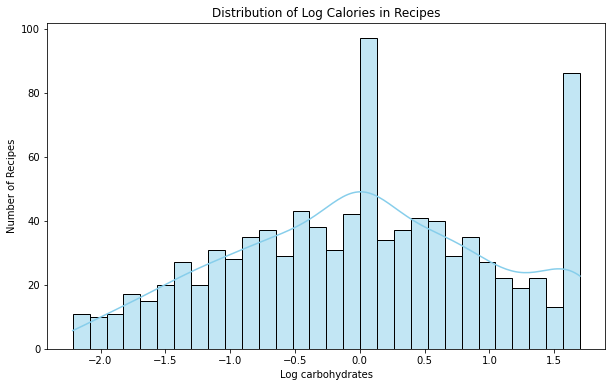

In [36]:
# Histogram for 'log_calories'
plt.figure(figsize=(10, 6))
sns.histplot(df['pt_carbohydrate'], kde=True, bins=30, color='skyblue')
plt.title('Distribution of Log Calories in Recipes')
plt.xlabel('Log carbohydrates')
plt.ylabel('Number of Recipes')
plt.show()

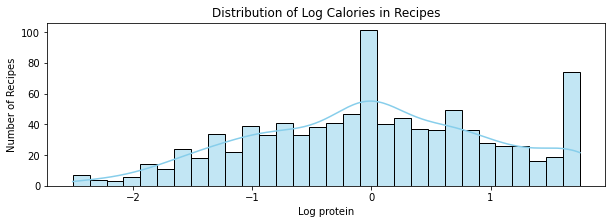

In [37]:
# Histogram for 'log_calories'
plt.figure(figsize=(10, 3))
sns.histplot(df['pt_calories'], kde=True, bins=30, color='skyblue')
plt.title('Distribution of Log Calories in Recipes')
plt.xlabel('Log protein')
plt.ylabel('Number of Recipes')
plt.show()

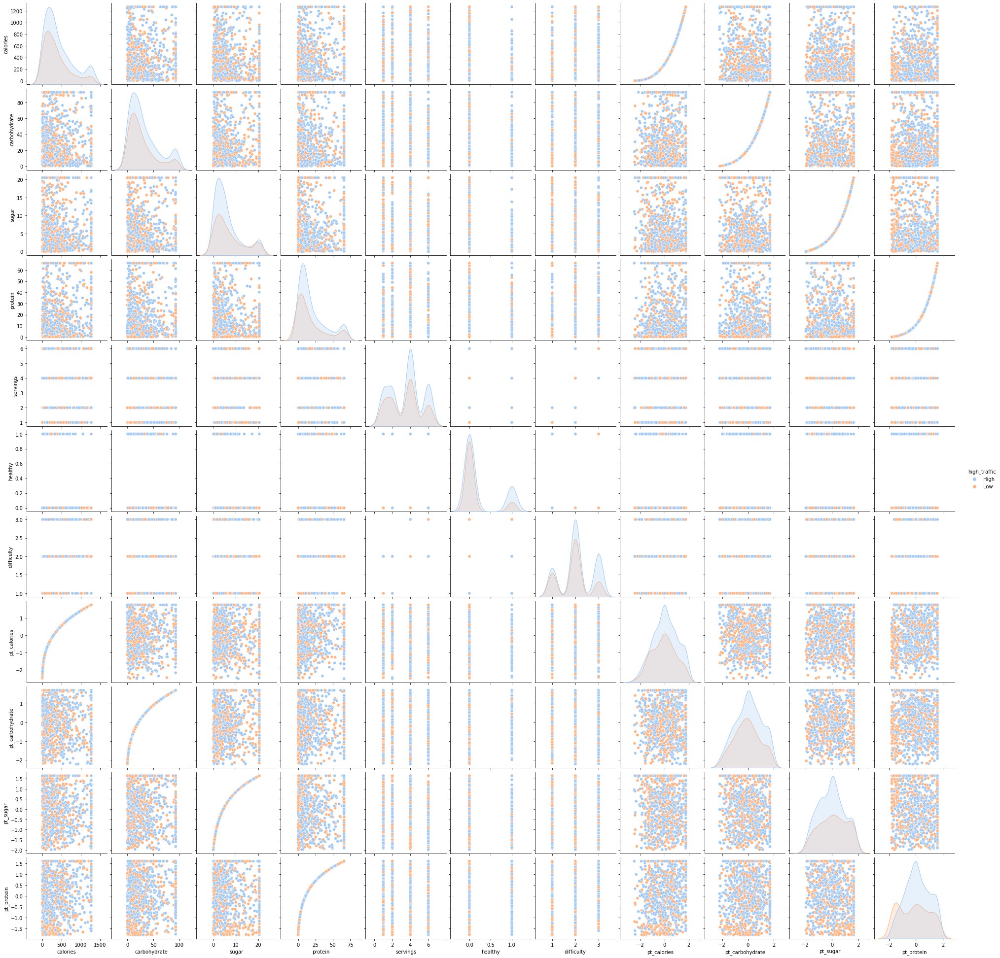

In [173]:
#searborn pairplot
sns.pairplot(df, hue = 'high_traffic', palette="pastel")
plt.show()

In [39]:
df.columns

Index(['calories', 'carbohydrate', 'sugar', 'protein', 'category', 'servings',
       'high_traffic', 'healthy', 'difficulty', 'pt_calories',
       'pt_carbohydrate', 'pt_sugar', 'pt_protein'],
      dtype='object')

In [40]:
# use statistcal test t-test to compare means of high traffic and low traffic in calories, carbohydrates, sugar, and protein
from scipy.stats import ttest_ind

# t-test for 'calories'
high_traffic_calories = df[df['high_traffic'] == 'High']['pt_calories']
low_traffic_calories = df[df['high_traffic'] == 'Low']['pt_calories']

ttest_ind(high_traffic_calories, low_traffic_calories)

# t-test for 'carbohydrate'
high_traffic_carbohydrate = df[df['high_traffic'] == 'High']['pt_carbohydrate']
low_traffic_carbohydrate = df[df['high_traffic'] == 'Low']['pt_carbohydrate']

ttest_ind(high_traffic_carbohydrate, low_traffic_carbohydrate)

# t-test for 'sugar'
high_traffic_sugar = df[df['high_traffic'] == 'High']['pt_sugar']
low_traffic_sugar = df[df['high_traffic'] == 'Low']['pt_sugar']

ttest_ind(high_traffic_sugar, low_traffic_sugar)

# t-test for 'protein'
high_traffic_protein = df[df['high_traffic'] == 'High']['pt_protein']
low_traffic_protein = df[df['high_traffic'] == 'Low']['pt_protein']

ttest_ind(high_traffic_protein, low_traffic_protein)

# print t-statistic and p-value for each variable
print('Calories: ', ttest_ind(high_traffic_calories, low_traffic_calories))
print('Carbohydrate: ', ttest_ind(high_traffic_carbohydrate, low_traffic_carbohydrate))
print('Sugar: ', ttest_ind(high_traffic_sugar, low_traffic_sugar))
print('Protein: ', ttest_ind(high_traffic_protein, low_traffic_protein))

Calories:  Ttest_indResult(statistic=2.0541995329156375, pvalue=0.04023099314711376)
Carbohydrate:  Ttest_indResult(statistic=1.8262981052884302, pvalue=0.0681207552159238)
Sugar:  Ttest_indResult(statistic=-2.100555484409667, pvalue=0.03594447777576452)
Protein:  Ttest_indResult(statistic=3.778427760646781, pvalue=0.00016770038234075908)


In [41]:
from scipy.stats import chi2_contingency,ttest_ind

contingency_table = pd.crosstab(df['category'], df['high_traffic'])
chi2, p, dof, expected = chi2_contingency(contingency_table)
chi2, p

(318.2935223075692, 3.417304408371102e-63)

the chi-squared statistic is 300.1309861002327, and the p-value below 0.05  means that we can reject the null hypothesis and conclude that there is a significant association between the category of the recipe and the level of traffic to the website when the recipe was shown.

as you will see in the following plot that shows the number of recipes that belong to each category and whether they have high traffic or not. From this plot, we can conclude that there is a strong association between the category and high_traffic variables

In [42]:
contingency_table = pd.crosstab(df['servings'], df['high_traffic'])
chi2, p, dof, expected = chi2_contingency(contingency_table)
chi2, p

(2.7369889309788054, 0.4339779666711946)

From the following plot and the p-value there is not significant association between the servings and the high traffic data

Model Fitting & Evaluation
It's clear that this is a classification problem. The target variable, high_traffic, is binary, indicating whether a recipe will lead to high traffic or not.

For the evaluation, I chose  Accuracy: This measures the proportion of correct predictions in the total predictions made. Given the goal of predicting high traffic recipes correctly 80% of the time, accuracy will be a primary metric of interest.

Approximately 59.78% of the recipes do not lead to high traffic (Class 0).

Approximately 40.22% of the recipes lead to high traffic (Class 1).

While there is a slight imbalance, it's not extremely skewed. However, even this degree of imbalance can sometimes lead to biased model predictions, especially if the model ends up favoring the majority class.

In [43]:
df

,calories,carbohydrate,sugar,protein,category,servings,high_traffic,healthy,difficulty,pt_calories,pt_carbohydrate,pt_sugar,pt_protein
recipe,,,,,,,,,,,,,
1,288.55,21.48,4.55,10.80,Pork,6,High,0,3,-0.003243,0.009159,0.021311,-0.001768
2,35.48,38.56,0.66,0.92,Potato,4,High,0,2,-1.443906,0.613120,-1.402296,-1.379026
3,914.28,42.68,3.09,2.88,Breakfast,1,Low,0,1,1.291509,0.727170,-0.340626,-0.877516
4,97.03,30.56,20.52,0.02,Beverages,4,High,0,2,-0.868755,0.362397,1.643819,-1.798229
5,27.05,1.85,0.80,0.53,Beverages,4,Low,0,2,-1.569741,-1.643838,-1.307421,-1.532845
...,...,...,...,...,...,...,...,...,...,...,...,...,...
943,1161.00,5.31,20.52,44.22,Lunch/Snacks,2,Low,0,1,1.621900,-1.097059,1.643819,1.207910
944,288.55,21.48,4.55,10.80,Potato,2,High,0,1,-0.003243,0.009159,0.021311,-0.001768
945,951.74,29.42,3.57,13.87,Pork,2,High,0,2,1.345365,0.322769,-0.209201,0.194031


In [44]:
import pandas as pd
from sklearn.preprocessing import PolynomialFeatures


In [45]:
df

,calories,carbohydrate,sugar,protein,category,servings,high_traffic,healthy,difficulty,pt_calories,pt_carbohydrate,pt_sugar,pt_protein
recipe,,,,,,,,,,,,,
1,288.55,21.48,4.55,10.80,Pork,6,High,0,3,-0.003243,0.009159,0.021311,-0.001768
2,35.48,38.56,0.66,0.92,Potato,4,High,0,2,-1.443906,0.613120,-1.402296,-1.379026
3,914.28,42.68,3.09,2.88,Breakfast,1,Low,0,1,1.291509,0.727170,-0.340626,-0.877516
4,97.03,30.56,20.52,0.02,Beverages,4,High,0,2,-0.868755,0.362397,1.643819,-1.798229
5,27.05,1.85,0.80,0.53,Beverages,4,Low,0,2,-1.569741,-1.643838,-1.307421,-1.532845
...,...,...,...,...,...,...,...,...,...,...,...,...,...
943,1161.00,5.31,20.52,44.22,Lunch/Snacks,2,Low,0,1,1.621900,-1.097059,1.643819,1.207910
944,288.55,21.48,4.55,10.80,Potato,2,High,0,1,-0.003243,0.009159,0.021311,-0.001768
945,951.74,29.42,3.57,13.87,Pork,2,High,0,2,1.345365,0.322769,-0.209201,0.194031


In [46]:
# convert with one hot encoding category,servings, high_traffic, use 0 and 1
df = pd.get_dummies(df, columns=['category', 'high_traffic'], drop_first=False)
df.head()

,calories,carbohydrate,sugar,protein,servings,healthy,difficulty,pt_calories,pt_carbohydrate,pt_sugar,...,category_Chicken,category_Dessert,category_Lunch/Snacks,category_Meat,category_One Dish Meal,category_Pork,category_Potato,category_Vegetable,high_traffic_High,high_traffic_Low
recipe,,,,,,,,,,,,,,,,,,,,,
1,288.55,21.48,4.55,10.80,6,0,3,-0.003243,0.009159,0.021311,...,0,0,0,0,0,1,0,0,1,0
2,35.48,38.56,0.66,0.92,4,0,2,-1.443906,0.613120,-1.402296,...,0,0,0,0,0,0,1,0,1,0
3,914.28,42.68,3.09,2.88,1,0,1,1.291509,0.727170,-0.340626,...,0,0,0,0,0,0,0,0,0,1
4,97.03,30.56,20.52,0.02,4,0,2,-0.868755,0.362397,1.643819,...,0,0,0,0,0,0,0,0,1,0
5,27.05,1.85,0.80,0.53,4,0,2,-1.569741,-1.643838,-1.307421,...,0,0,0,0,0,0,0,0,0,1


In [47]:
# replace False with 0 and True with 1 on all columns
df = df.replace(False, 0)
df = df.replace(True, 1)

In [48]:
#rename high_traffic_Low to high_traffic
df.rename(columns={'high_traffic_Low': 'high_traffic'}, inplace=True)

In [49]:
df.head()

,calories,carbohydrate,sugar,protein,servings,healthy,difficulty,pt_calories,pt_carbohydrate,pt_sugar,...,category_Chicken,category_Dessert,category_Lunch/Snacks,category_Meat,category_One Dish Meal,category_Pork,category_Potato,category_Vegetable,high_traffic_High,high_traffic
recipe,,,,,,,,,,,,,,,,,,,,,
1,288.55,21.48,4.55,10.80,6,0,3,-0.003243,0.009159,0.021311,...,0,0,0,0,0,1,0,0,1,0
2,35.48,38.56,0.66,0.92,4,0,2,-1.443906,0.613120,-1.402296,...,0,0,0,0,0,0,1,0,1,0
3,914.28,42.68,3.09,2.88,1,0,1,1.291509,0.727170,-0.340626,...,0,0,0,0,0,0,0,0,0,1
4,97.03,30.56,20.52,0.02,4,0,2,-0.868755,0.362397,1.643819,...,0,0,0,0,0,0,0,0,1,0
5,27.05,1.85,0.80,0.53,4,0,2,-1.569741,-1.643838,-1.307421,...,0,0,0,0,0,0,0,0,0,1


In [50]:
#drop high_traffic_High
df.drop(columns=['high_traffic_High'], inplace=True)

In [51]:
#check for missing values
df.isnull().sum()

calories                  0
carbohydrate              0
sugar                     0
protein                   0
servings                  0
healthy                   0
difficulty                0
pt_calories               0
pt_carbohydrate           0
pt_sugar                  0
pt_protein                0
category_Beverages        0
category_Breakfast        0
category_Chicken          0
category_Dessert          0
category_Lunch/Snacks     0
category_Meat             0
category_One Dish Meal    0
category_Pork             0
category_Potato           0
category_Vegetable        0
high_traffic              0
dtype: int64

In [52]:
# drop calroies, sugar, carbohydrate, protein
#df.drop(['calories', 'sugar', 'carbohydrate', 'protein'], axis=1, inplace=True)

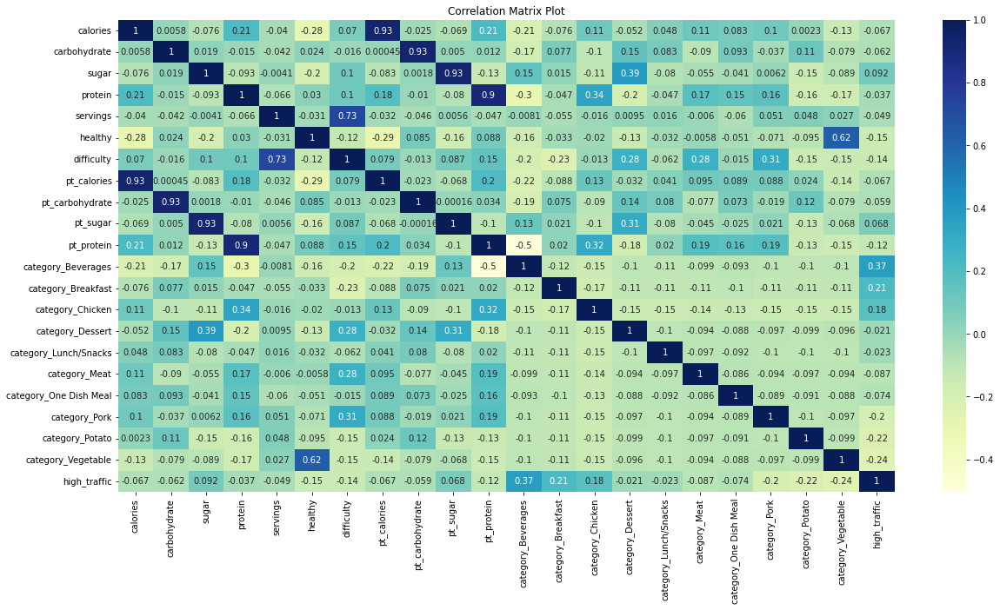

In [53]:
# show correlation matrix plot of all variables
plt.figure(figsize=(20, 10))
sns.heatmap(df.corr(), annot=True, cmap="YlGnBu")
plt.title("Correlation Matrix Plot")
plt.show()


In [54]:
# aboslute high correlation  values with 'high_traffic' above abs values 0.001
high_corr = df.corr()['high_traffic'].abs().sort_values(ascending=False)
high_corr = high_corr[high_corr > 0.001]
high_corr




high_traffic              1.000000
category_Beverages        0.370437
category_Vegetable        0.242208
category_Potato           0.220794
category_Breakfast        0.214204
category_Pork             0.198287
category_Chicken          0.175195
healthy                   0.150135
difficulty                0.141433
pt_protein                0.121994
sugar                     0.092399
category_Meat             0.086880
category_One Dish Meal    0.073573
pt_sugar                  0.068172
calories                  0.066761
pt_calories               0.066674
carbohydrate              0.062259
pt_carbohydrate           0.059305
servings                  0.048708
protein                   0.036630
category_Lunch/Snacks     0.022626
category_Dessert          0.020571
Name: high_traffic, dtype: float64

In [174]:
# find the most important features relative to target with SelectKBest

X = df.drop('high_traffic', axis=1)
y = df['high_traffic']


In [175]:
# Feature importance with logistic classifier
from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import RFE

# Initialize the logistic regression
logreg = LogisticRegression()

# Fit the model
logreg.fit(X, y)

# Get the feature importances
feature_importances = logreg.coef_[0]

# Create a DataFrame for visualization
features_df = pd.DataFrame({
    'Feature': X.columns,
    'Importance': feature_importances
})

# Sort the DataFrame by importance
features_df = features_df.sort_values(by='Importance', ascending=False)

# Plot the feature importances
plt.figure(figsize=(10,6))
plt.barh(features_df['Feature'], features_df['Importance'], color='skyblue')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Feature Importances using Logistic Regression')
plt.gca().invert_yaxis()  # Highest importances at the top
plt.show()


ValueError: could not convert string to float: 'Pork'

In [57]:
# rank all features in a table in absolute order of importance from the previous model
features_df['Importance'] = abs(features_df['Importance'])
features_df = features_df.sort_values(by='Importance', ascending=False)
features_df

,Feature,Importance
11,category_Beverages,1.854013
19,category_Potato,1.663069
20,category_Vegetable,1.631699
12,category_Breakfast,1.404027
13,category_Chicken,1.276373
18,category_Pork,1.052441
5,healthy,0.760460
10,pt_protein,0.584456
6,difficulty,0.558684
8,pt_carbohydrate,0.456227


In [58]:
# Drop  log_protein, log_carbohydrates, sugar, log_calories,  'carbohydrate', 'sugar'
df.drop([ 'protein','carbohydrate','sugar','calories'], axis=1, inplace=True)

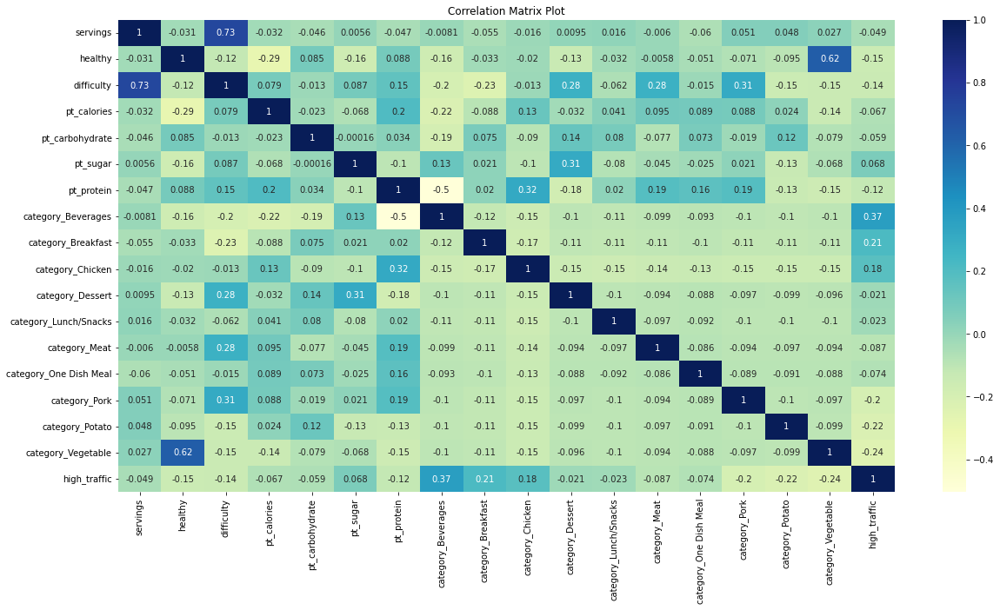

In [59]:
# show correlation matrix plot of all variables
plt.figure(figsize=(20, 10))
sns.heatmap(df.corr(), annot=True, cmap="YlGnBu")
plt.title("Correlation Matrix Plot")
plt.show()

In [60]:
#Use sharply to see the best features


In [61]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 947 entries, 1 to 947
Data columns (total 18 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   servings                947 non-null    int64  
 1   healthy                 947 non-null    int64  
 2   difficulty              947 non-null    int64  
 3   pt_calories             947 non-null    float64
 4   pt_carbohydrate         947 non-null    float64
 5   pt_sugar                947 non-null    float64
 6   pt_protein              947 non-null    float64
 7   category_Beverages      947 non-null    uint8  
 8   category_Breakfast      947 non-null    uint8  
 9   category_Chicken        947 non-null    uint8  
 10  category_Dessert        947 non-null    uint8  
 11  category_Lunch/Snacks   947 non-null    uint8  
 12  category_Meat           947 non-null    uint8  
 13  category_One Dish Meal  947 non-null    uint8  
 14  category_Pork           947 non-null    ui

In [62]:
#remove servings_2,servings_4,servings_6
#df.drop(['servings_6'], axis=1, inplace=True)

# Model Fitting and Evaluation 

Predicting whether a recipe will lead to high traffic is a binary classification problem in machine learning. Given the nature of our dataset and the need for interpretability, I am choosing the Logistic Regression model. Logistic Regression is suitable for binary outcomes and provides probabilities that can be interpreted and calibrated. The model also works well when there's a linear decision boundary between classes.

As a comparison model, I'm selecting the Random Forest classifier. Random Forest is an ensemble method that can capture complex relationships in the data without needing explicit feature engineering. It's robust to outliers and can handle imbalanced datasets by adjusting class weights or through bootstrapping.

For evaluation, given the class imbalance and the nature of our problem, I'm prioritizing the F1-Score and ROC-AUC. The F1-Score provides a balance between precision and recall, making it a more comprehensive metric than accuracy for imbalanced datasets. ROC-AUC, on the other hand, gives us insights into the model's capability to distinguish between recipes that lead to high traffic and those that don't. Additionally, we'll also monitor Accuracy, Precision, and Recall to ensure our model's predictions are both precise and comprehensive.

This text is adapted to describe the problem at hand, the chosen models, and the rationale behind the model choices and evaluation metrics.

# Prepare Data for Modelling 
To facilitate the prediction of whether a recipe will lead to high traffic, we selected features like calories, sugar, carbohydrates, and protein among others, with high_traffic as the target variable. To further refine our dataset for modeling, the following transformations were applied:

Standardization of Numeric Features: Given the varied scales of our numeric features, we standardized them to have a mean of 0 and a standard deviation of 1. This ensures that all features contribute equally to the model's performance.

Encoding Categorical Variables: Any categorical variables in our dataset were converted into numeric representations, ensuring our models can process them effectively.

Data Splitting: To evaluate our model's performance on unseen data, we split the dataset into a training set (to train the model) and a test set (to evaluate the model).



In [63]:
#import standard scaler
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler

#import train test split
from sklearn.model_selection import train_test_split

# Split the data into training and test sets
X = df.drop('high_traffic', axis=1)
y = df['high_traffic']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)

# Standardize the features
#scaler = StandardScaler()
scaler = MinMaxScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [64]:
# Get the value counts for each class
class_counts = y.value_counts()

# Calculate the percentage distribution of each class
class_percentage = (class_counts / len(y)) * 100
class_percentage

0    60.61246
1    39.38754
Name: high_traffic, dtype: float64

In [65]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
# Esemble model , measure F1 score, precious, recall, accuracy
from sklearn.metrics import f1_score, precision_score, recall_score, accuracy_score

# Initialize and fit the baseline model: Logistic Regression
logreg = LogisticRegression(class_weight='balanced',penalty='l2',C=0.001)
logreg.fit(X_train, y_train)

# Predict on the test set
y_pred_baseline = logreg.predict(X_test)

# Evaluate the performance of the baseline model
accuracy_baseline = f1_score(y_test, y_pred_baseline)
accuracy_baseline

0.6507936507936508

In [66]:
from sklearn.model_selection import cross_val_score
from sklearn.metrics import make_scorer

# Define the metrics
scoring_metrics = {
    'f1': 'f1',
    'f1_weighted': 'f1_weighted',
    'roc_auc': 'roc_auc',
    'neg_log_loss': 'neg_log_loss',
    'accuracy': 'accuracy',
    'precision': 'precision',
    'recall': 'recall',
    'auc': 'roc_auc'
}

# Evaluate the model using cross-validation
scores = {}
for metric_name, metric in scoring_metrics.items():
    cv_score = cross_val_score(logreg, X_train, y_train, cv=5, scoring=metric)
    scores[metric_name] = cv_score.mean()

scores


{'f1': 0.6651188065694063,
 'f1_weighted': 0.7303020833849565,
 'roc_auc': 0.8094187877403287,
 'neg_log_loss': -0.6871281884687944,
 'accuracy': 0.72967646388699,
 'precision': 0.6518114435429343,
 'recall': 0.6817851959361393,
 'auc': 0.8094187877403287}

In [67]:
# check classifcation model
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred_baseline))


              precision    recall  f1-score   support

           0       0.79      0.66      0.72       173
           1       0.59      0.73      0.65       112

    accuracy                           0.69       285
   macro avg       0.69      0.70      0.69       285
weighted avg       0.71      0.69      0.69       285



In [68]:
# build model 'LinearSVC' and measure F1 score, precious, recall, accuracy using cross validation
from sklearn.svm import LinearSVC

# Initialize and fit the model
lsvc = LinearSVC(class_weight='balanced')
lsvc.fit(X_train, y_train)

# Predict on the test set
y_pred_lsvc = lsvc.predict(X_test)

# Evaluate the performance of the model
accuracy_lsvc = f1_score(y_test, y_pred_lsvc)
accuracy_lsvc

# Evaluate the model using cross-validation
scores = {}
for metric_name, metric in scoring_metrics.items():
    cv_score = cross_val_score(lsvc, X_train, y_train, cv=5, scoring=metric)
    scores[metric_name] = cv_score.mean()

scores

# check classifcation model
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred_lsvc))



              precision    recall  f1-score   support

           0       0.85      0.58      0.69       173
           1       0.57      0.84      0.68       112

    accuracy                           0.68       285
   macro avg       0.71      0.71      0.68       285
weighted avg       0.74      0.68      0.69       285



/Users/stephaniegessler/opt/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:696: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/stephaniegessler/opt/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 687, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/Users/stephaniegessler/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_scorer.py", line 87, in __call__
    score = scorer._score(cached_call, estimator,
  File "/Users/stephaniegessler/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_scorer.py", line 277, in _score
    y_pred = method_caller(clf, "predict_proba", X)
  File "/Users/stephaniegessler/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_scorer.py", line 53, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
AttributeError: 'Linea

In [69]:
# bernoulli naive bayes classifier
from sklearn.naive_bayes import BernoulliNB
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold

# define model
model = BernoulliNB(alpha=0.255)
# define evaluation procedure
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=42)
# evaluate model
scores = cross_val_score(model, X, y, scoring='f1', cv=cv, n_jobs=-1)
# summarize performance
print('Mean F1: %.3f' % np.mean(scores))

#predict on test set
model.fit(X_train, y_train)
y_pred = model.predict(X_test)

# check classifcation model
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))


<frozen importlib._bootstrap>:228: RuntimeWarning: scipy._lib.messagestream.MessageStream size changed, may indicate binary incompatibility. Expected 56 from C header, got 64 from PyObject
<frozen importlib._bootstrap>:228: RuntimeWarning: scipy._lib.messagestream.MessageStream size changed, may indicate binary incompatibility. Expected 56 from C header, got 64 from PyObject
<frozen importlib._bootstrap>:228: RuntimeWarning: scipy._lib.messagestream.MessageStream size changed, may indicate binary incompatibility. Expected 56 from C header, got 64 from PyObject
<frozen importlib._bootstrap>:228: RuntimeWarning: scipy._lib.messagestream.MessageStream size changed, may indicate binary incompatibility. Expected 56 from C header, got 64 from PyObject
<frozen importlib._bootstrap>:228: RuntimeWarning: scipy._lib.messagestream.MessageStream size changed, may indicate binary incompatibility. Expected 56 from C header, got 64 from PyObject
<frozen importlib._bootstrap>:228: RuntimeWarning: scip

Mean F1: 0.660
              precision    recall  f1-score   support

           0       0.78      0.78      0.78       173
           1       0.66      0.66      0.66       112

    accuracy                           0.73       285
   macro avg       0.72      0.72      0.72       285
weighted avg       0.73      0.73      0.73       285



In [70]:
#SDG classifier
from sklearn.linear_model import SGDClassifier
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold

# define model
model = SGDClassifier()
# define evaluation procedure
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=42)
# evaluate model
scores = cross_val_score(model, X, y, scoring='f1', cv=cv, n_jobs=-1)
# summarize performance
print('Mean F1: %.3f' % np.mean(scores))

#predict on test set
model.fit(X_train, y_train)
y_pred = model.predict(X_test)

# check classifcation model
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))


Mean F1: 0.571
              precision    recall  f1-score   support

           0       0.91      0.35      0.51       173
           1       0.49      0.95      0.64       112

    accuracy                           0.59       285
   macro avg       0.70      0.65      0.58       285
weighted avg       0.74      0.59      0.56       285



In [71]:
# Build a model with ExtraTreesClassifier
from sklearn.ensemble import ExtraTreesClassifier

from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold

# define model
model = ExtraTreesClassifier(n_estimators=250)
# define evaluation procedure
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=42)
# evaluate model
scores = cross_val_score(model, X, y, scoring='f1', cv=cv, n_jobs=-1)
# summarize performance
print('Mean F1: %.3f' % np.mean(scores))

#predict on test set
model.fit(X_train, y_train)
y_pred = model.predict(X_test)

# check classifcation model
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))



Mean F1: 0.637
              precision    recall  f1-score   support

           0       0.76      0.77      0.77       173
           1       0.64      0.62      0.63       112

    accuracy                           0.71       285
   macro avg       0.70      0.70      0.70       285
weighted avg       0.71      0.71      0.71       285



In [72]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV


rf=RandomForestClassifier()
param_grid = {'n_estimators': [10, 50, 100,150,200],
              'max_depth': [None, 5, 10]
              }
gs=GridSearchCV(rf,param_grid)
gs.fit(X_train,y_train)

GridSearchCV(estimator=RandomForestClassifier(),
             param_grid={'max_depth': [None, 5, 10],
                         'n_estimators': [10, 50, 100, 150, 200]})

In [73]:
# check best parameters
gs.best_params_

{'max_depth': 5, 'n_estimators': 10}

In [74]:
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score, f1_score

y_pred = gs.predict(X_test)
acc = accuracy_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

print("confussion matrix: ",conf_matrix)
print("accuarcy: ",acc)
print("precision: ", precision)
print("recall: ",recall)
print("f1: ",f1)

confussion matrix:  [[152  21]
 [ 54  58]]
accuarcy:  0.7368421052631579
precision:  0.7341772151898734
recall:  0.5178571428571429
f1:  0.6073298429319371


In [75]:
# Build a model with GradientBoostingClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold

# define model
model = GradientBoostingClassifier(n_estimators=30, max_depth=4)
# define evaluation procedure
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=42)
# evaluate model
scores = cross_val_score(model, X, y, scoring='f1', cv=cv, n_jobs=-1)
# summarize performance
print('Mean F1: %.3f' % np.mean(scores))

#predict on test set
model.fit(X_train, y_train)
y_pred = model.predict(X_test)

# check classifcation model
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))


Mean F1: 0.666
              precision    recall  f1-score   support

           0       0.79      0.80      0.79       173
           1       0.69      0.66      0.67       112

    accuracy                           0.75       285
   macro avg       0.74      0.73      0.73       285
weighted avg       0.75      0.75      0.75       285



In [76]:
#Build model with XGBClassifier
from xgboost import XGBClassifier
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold

# define model
model = XGBClassifier()
# define evaluation procedure
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=42)
# evaluate model
scores = cross_val_score(model, X, y, scoring='f1', cv=cv, n_jobs=-1)
# summarize performance
print('Mean F1: %.3f' % np.mean(scores))

#predict on test set
model.fit(X_train, y_train)
y_pred = model.predict(X_test)

# check classifcation model
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))


Mean F1: 0.586
              precision    recall  f1-score   support

           0       0.72      0.68      0.70       173
           1       0.54      0.58      0.56       112

    accuracy                           0.64       285
   macro avg       0.63      0.63      0.63       285
weighted avg       0.65      0.64      0.64       285



In [77]:
# Esemble model SGDClassifier and BernoulliNB, measure F1 score, precious, recall, accuracy
from sklearn.ensemble import VotingClassifier
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold

# define the base models
models = list()
models.append(('SGDClassifier', SGDClassifier()))
models.append(('LinearSVC', LinearSVC(class_weight='balanced')))
models.append(('BernoulliNB', BernoulliNB(alpha=0.255)))
models.append(('LogisticRegression', LogisticRegression(class_weight='balanced',penalty='l2',C=0.001)))
models.append(('GradientBoost', GradientBoostingClassifier(n_estimators=30, max_depth=4)))

# define the voting ensemble
ensemble = VotingClassifier(estimators=models, voting='hard')
# define evaluation procedure
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=42)
# evaluate the ensemble
scores = cross_val_score(ensemble, X, y, scoring='f1', cv=cv, n_jobs=-1)
# summarize performance
print('Mean F1: %.3f' % np.mean(scores))

#summarize AUC score
from sklearn.metrics import roc_auc_score
# evaluate each model in turn
results = []
names = []
for name, model in models:
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    f1 = roc_auc_score(y_test, y_pred)
    results.append(f1)
    names.append(name)
    print('%s: %f' % (name, f1))


#predict on test set
ensemble.fit(X_train, y_train)
y_pred = ensemble.predict(X_test)  # Corrected this line

# check classification report
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))


/Users/stephaniegessler/opt/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/Users/stephaniegessler/opt/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/Users/stephaniegessler/opt/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/Users/stephaniegessler/opt/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/Users/stephaniegessler/opt/anaconda3/lib/python3.9/site-pac

Mean F1: 0.668
SGDClassifier: 0.693693
LinearSVC: 0.711550
BernoulliNB: 0.720531
LogisticRegression: 0.698441
GradientBoost: 0.727627
              precision    recall  f1-score   support

           0       0.79      0.72      0.76       173
           1       0.62      0.71      0.66       112

    accuracy                           0.72       285
   macro avg       0.71      0.71      0.71       285
weighted avg       0.72      0.72      0.72       285



In [78]:
pip install h2o

Note: you may need to restart the kernel to use updated packages.


In [106]:
import h2o
from h2o.automl import H2OAutoML
h2o.init()
h2o_df = h2o.H2OFrame(df)
# Convert the 'high_traffic' column to a factor (categorical variable)
h2o_df['high_traffic'] = h2o_df['high_traffic'].asfactor()

# Now, split the H2OFrame
train, test = h2o_df.split_frame(ratios=[0.8], seed=1)

# Continue with the rest of your code
aml = H2OAutoML(max_models=30, balance_classes=True, seed=1,max_runtime_secs=2100)
aml.train(training_frame=train, y='high_traffic')
lb = aml.leaderboard
lb.head(rows=10)

Checking whether there is an H2O instance running at http://localhost:54321..... not found.
Attempting to start a local H2O server...
  Java Version: java version "1.8.0_371"; Java(TM) SE Runtime Environment (build 1.8.0_371-b11); Java HotSpot(TM) 64-Bit Server VM (build 25.371-b11, mixed mode)
  Starting server from /Users/stephaniegessler/opt/anaconda3/lib/python3.9/site-packages/h2o/backend/bin/h2o.jar
  Ice root: /var/folders/ks/5bc1x9p158vgc4774v7r2tq40000gn/T/tmp3sg_qy13
  JVM stdout: /var/folders/ks/5bc1x9p158vgc4774v7r2tq40000gn/T/tmp3sg_qy13/h2o_stephaniegessler_started_from_python.out
  JVM stderr: /var/folders/ks/5bc1x9p158vgc4774v7r2tq40000gn/T/tmp3sg_qy13/h2o_stephaniegessler_started_from_python.err
  Server is running at http://127.0.0.1:54321
Connecting to H2O server at http://127.0.0.1:54321 ... successful.


H2O_cluster_uptime:,13 secs
H2O_cluster_timezone:,Europe/Zurich
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.44.0.1
H2O_cluster_version_age:,2 days
H2O_cluster_name:,H2O_from_python_stephaniegessler_l5w584
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,3.542 Gb
H2O_cluster_total_cores:,0
H2O_cluster_allowed_cores:,0
H2O_cluster_status:,"locked, healthy"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
AutoML progress: |███████████████████████████████████████████████████████████████| (done) 100%


model_id,auc,logloss,aucpr,mean_per_class_error,rmse,mse
StackedEnsemble_BestOfFamily_1_AutoML_1_20231018_200623,0.899381,0.449941,0.911011,0.205882,0.384332,0.147711
GLM_1_AutoML_1_20231018_200623,0.884675,0.440677,0.888755,0.18808,0.383745,0.14726
DeepLearning_grid_1_AutoML_1_20231018_200623_model_1,0.884675,0.455242,0.900987,0.18808,0.390871,0.15278
GBM_grid_1_AutoML_1_20231018_200623_model_3,0.883127,0.474686,0.896364,0.204334,0.400161,0.160129
DeepLearning_1_AutoML_1_20231018_200623,0.882353,0.42851,0.883,0.186533,0.372844,0.139013
GBM_grid_1_AutoML_1_20231018_200623_model_2,0.873065,0.496693,0.89629,0.23065,0.409249,0.167485
DeepLearning_grid_2_AutoML_1_20231018_200623_model_2,0.872291,0.527991,0.887503,0.215944,0.413273,0.170794
DeepLearning_grid_2_AutoML_1_20231018_200623_model_1,0.867647,0.515502,0.884422,0.170279,0.38008,0.144461
DRF_1_AutoML_1_20231018_200623,0.864551,0.513553,0.883876,0.18808,0.421669,0.177804
StackedEnsemble_AllModels_1_AutoML_1_20231018_200623,0.863003,0.470866,0.874794,0.165635,0.393385,0.154752


In [107]:
best_model = aml.get_best_model()
print(best_model)

Model Details
H2OStackedEnsembleEstimator : Stacked Ensemble
Model Key: StackedEnsemble_BestOfFamily_1_AutoML_1_20231018_200623


Model Summary for Stacked Ensemble: 
key                                        value
-----------------------------------------  --------
Stacking strategy                          blending
Number of base models (used / total)       2/6
# GBM base models (used / total)           1/1
# XGBoost base models (used / total)       0/1
# GLM base models (used / total)           1/1
# DeepLearning base models (used / total)  0/1
# DRF base models (used / total)           0/2
Metalearner algorithm                      GLM
Metalearner fold assignment scheme         AUTO
Metalearner nfolds                         0
Metalearner fold_column
Custom metalearner hyperparameters         None

ModelMetricsBinomialGLM: stackedensemble
** Reported on train data. **

MSE: 0.14062237626950674
RMSE: 0.37499650167635795
LogLoss: 0.43360371411852
AUC: 0.8900254823443757
AUCPR: 0.844

In [108]:
aml.leader

key,value
Stacking strategy,blending
Number of base models (used / total),2/6
# GBM base models (used / total),1/1
# XGBoost base models (used / total),0/1
# GLM base models (used / total),1/1
# DeepLearning base models (used / total),0/1
# DRF base models (used / total),0/2
Metalearner algorithm,GLM
Metalearner fold assignment scheme,AUTO
Metalearner nfolds,0


model_id,auc,logloss,aucpr,mean_per_class_error,rmse,mse,training_time_ms,predict_time_per_row_ms,algo
XGBoost_grid_1_AutoML_1_20231018_200623_model_3,0.69939,0.61362,0.504643,0.311939,0.46262,0.214017,249,0.013565,XGBoost


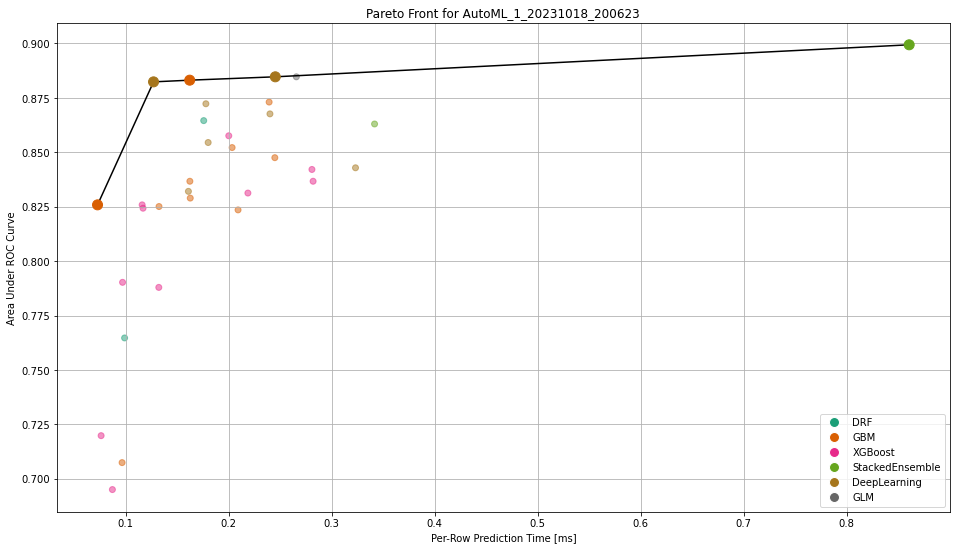

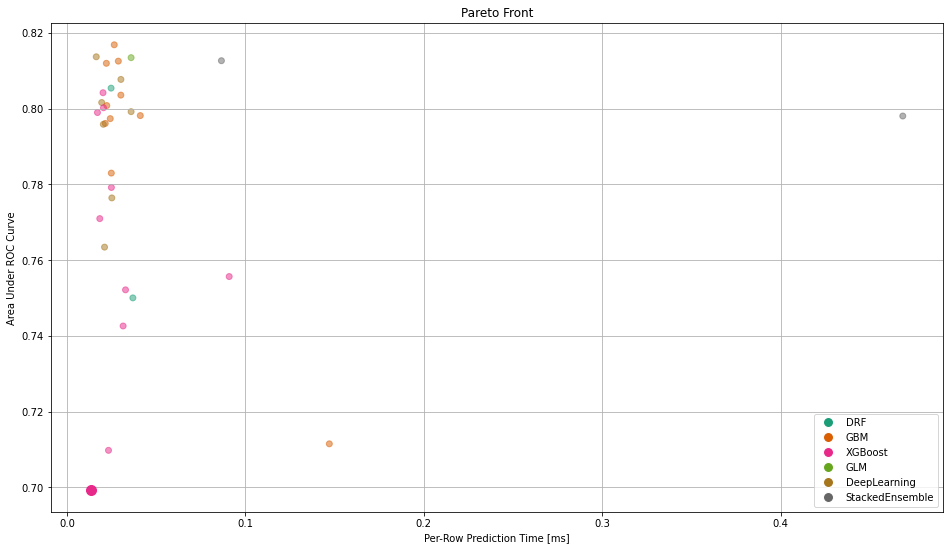

In [118]:
#show paretto front plot for automl aml
pf = aml.pareto_front()
pf.figure() # get the Pareto front plot
pf # H2OFrame containing the Pareto front subset of the leaderboard

combined_leaderboard = h2o.make_leaderboard([aml], test, extra_columns="ALL")
pf = h2o.explanation.pareto_front(combined_leaderboard, x_metric="predict_time_per_row_ms", y_metric="auc", optimum="bottom left")
pf.figure() # get the Pareto front plot
pf # H2OFrame containing the Pareto front subset of the leaderboard

In [110]:
# save best model
save_dir = os.getcwd()
model_path = h2o.save_model(model=aml.leader, path=save_dir, force=True)

In [114]:
#load model
model = h2o.load_model('/Users/stephaniegessler/Documents/GitHub/recipe_site_traffic/StackedEnsemble_BestOfFamily_1_AutoML_1_20231018_200623')

#show model performance
model.model_performance()
 
    
#show model performance on training data
model.model_performance(train=True)
 
 
#show model performance on test data
model.model_performance(valid=True)
 
 
#show model performance on cross validation data
model.model_performance(xval=True)

In [112]:
best_model.model_performance(test)

ModelMetricsBinomialGLM: stackedensemble
** Reported on test data. **

MSE: 0.1621192602861235
RMSE: 0.4026403609750561
LogLoss: 0.4934737040952079
AUC: 0.8126293995859214
AUCPR: 0.7334302379725465
Gini: 0.6252587991718428
Null degrees of freedom: 194
Residual degrees of freedom: 192
Null deviance: 258.83909274002247
Residual deviance: 192.45474459713105
AIC: 198.45474459713105

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4474553220607081
       0    1    Error    Rate
-----  ---  ---  -------  ------------
0      101  25   0.1984   (25.0/126.0)
1      22   47   0.3188   (22.0/69.0)
Total  123  72   0.241    (47.0/195.0)

Maximum Metrics: Maximum metrics at their respective thresholds
metric                       threshold    value     idx
---------------------------  -----------  --------  -----
max f1                       0.447455     0.666667  71
max f2                       0.274782     0.810811  130
max f0point5                 0.669307     0.677966  26
max accuracy                 0.542377     0.764103  56
max precision                0.900201     1         0
max recall                   0.00572653   1         186
max specificity              0.900201     1         0
max absolute_mcc             0.447455     0.478311  71
max min_per_class_accuracy   0.396563     0.722222  84
max mean_per_class_accuracy  0.447455     0.741373  71
max tns                      0.900201     126       0
max fns                      0.900201     68        0
max fps                      0.00479059   126       194
max tps                      0.00572653   69        186
max tnr                      0.900201     1         0
max fnr                      0.900201     0.985507  0
max fpr                      0.00479059   1         194
max tpr                      0.00572653   1         186

Gains/Lift Table: Avg response rate: 35.38 %, avg score: 38.43 %
group    cumulative_data_fraction    lower_threshold    lift      cumulative_lift    response_rate    score       cumulative_response_rate    cumulative_score    capture_rate    cumulative_capture_rate    gain      cumulative_gain    kolmogorov_smirnov
-------  --------------------------  -----------------  --------  -----------------  ---------------  ----------  --------------------------  ------------------  --------------  -------------------------  --------  -----------------  --------------------
1        0.0102564                   0.889383           2.82609   2.82609            1                0.898686    1                           0.898686            0.0289855       0.0289855                  182.609   182.609            0.0289855
2        0.0205128                   0.880782           2.82609   2.82609            1                0.887704    1                           0.893195            0.0289855       0.057971                   182.609   182.609            0.057971
3        0.0307692                   0.876463           2.82609   2.82609            1                0.878416    1                           0.888269            0.0289855       0.0869565                  182.609   182.609            0.0869565
4        0.0410256                   0.873641           2.82609   2.82609            1                0.87569     1                           0.885124            0.0289855       0.115942                   182.609   182.609            0.115942
5        0.0512821                   0.865585           2.82609   2.82609            1                0.871401    1                           0.882379            0.0289855       0.144928                   182.609   182.609            0.144928
6        0.102564                    0.707857           2.54348   2.68478            0.9              0.816391    0.95                        0.849385            0.130435        0.275362                   154.348   168.478            0.267426
7        0.153846                    0.660951           1.69565   2.35507            0.6              0.678312    0.833333                    0.792361       

In [116]:
#use model to predict on test data
pred = model.predict(test)

#show predictions
pred

#show predictions as pandas dataframe
pred_df = pred.as_data_frame()
pred_df

stackedensemble prediction progress: |

███████████████████████████████████████████| (done) 100%


,predict,p0,p1
0,1,0.329639,0.670361
1,1,0.330693,0.669307
2,0,0.902941,0.097059
3,1,0.412428,0.587572
4,0,0.994794,0.005206
...,...,...,...
190,1,0.633850,0.366150
191,1,0.126787,0.873213
192,0,0.847905,0.152095
193,0,0.856426,0.143574


In [119]:
#show predictions as pandas dataframe with actual values
pred_df = pred.as_data_frame()
pred_df['actual'] = test['high_traffic'].as_data_frame()
pred_df

,predict,p0,p1,actual
0,1,0.329639,0.670361,1
1,1,0.330693,0.669307,1
2,0,0.902941,0.097059,0
3,1,0.412428,0.587572,1
4,0,0.994794,0.005206,0
...,...,...,...,...
190,1,0.633850,0.366150,0
191,1,0.126787,0.873213,1
192,0,0.847905,0.152095,0
193,0,0.856426,0.143574,0


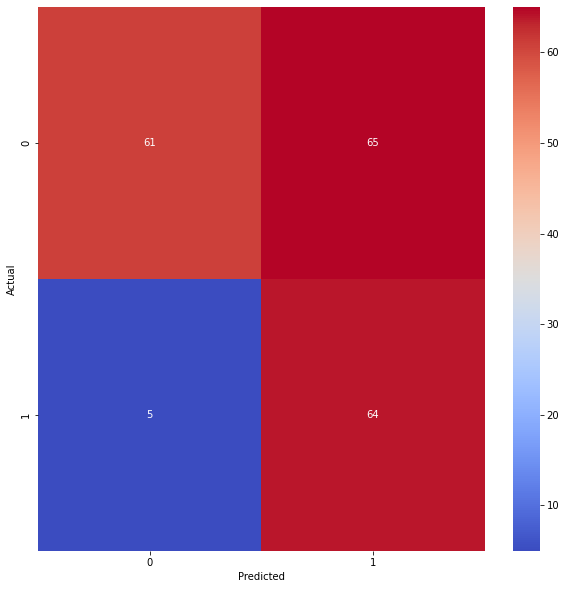

In [120]:
#plot confusion matrix
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(pred_df['actual'], pred_df['predict'])
plt.figure(figsize=(10,10))
sns.heatmap(cm, annot=True, cmap='coolwarm')
plt.xlabel('Predicted')
plt.ylabel('Actual')    
plt.show()

In [121]:
#show classification report
from sklearn.metrics import classification_report
print(classification_report(pred_df['actual'], pred_df['predict']))

              precision    recall  f1-score   support

           0       0.92      0.48      0.64       126
           1       0.50      0.93      0.65        69

    accuracy                           0.64       195
   macro avg       0.71      0.71      0.64       195
weighted avg       0.77      0.64      0.64       195



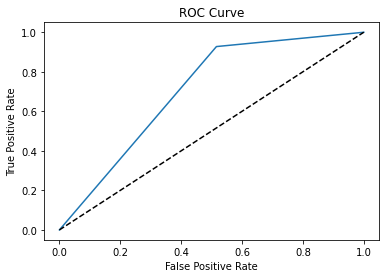

In [122]:
#show roc curve
from sklearn.metrics import roc_curve
fpr, tpr, thresholds = roc_curve(pred_df['actual'], pred_df['predict'])
plt.plot(fpr, tpr)
plt.plot([0,1], [0,1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.show()

In [123]:
#show auc score
from sklearn.metrics import roc_auc_score
roc_auc_score(pred_df['actual'], pred_df['predict'])

0.705831608005521

In [124]:
#show accuracy score
from sklearn.metrics import accuracy_score
accuracy_score(pred_df['actual'], pred_df['predict'])

0.6410256410256411

In [125]:

#show precision score
from sklearn.metrics import precision_score
precision_score(pred_df['actual'], pred_df['predict'])

0.49612403100775193

In [126]:
#show recall score
from sklearn.metrics import recall_score
recall_score(pred_df['actual'], pred_df['predict'])

0.927536231884058

In [127]:
#show f1 score
from sklearn.metrics import f1_score    
f1_score(pred_df['actual'], pred_df['predict'])

0.6464646464646464

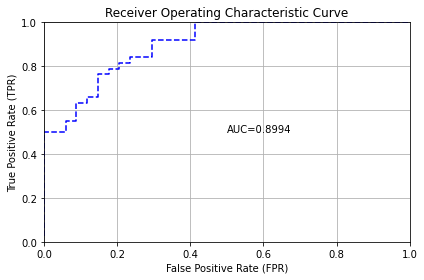

In [128]:
#plot auc curve
model.model_performance(valid=True).plot()
plt.show()

In [87]:
h2o.shutdown()

H2O session _sid_b5a9 closed.


/var/folders/ks/5bc1x9p158vgc4774v7r2tq40000gn/T/ipykernel_20905/2900054706.py:1: H2ODeprecationWarning: Deprecated, use ``h2o.cluster().shutdown()``.
  h2o.shutdown()


In [91]:
pip install auto-sklearn


Note: you may need to restart the kernel to use updated packages.


In [92]:
import autosklearn.classification


In [93]:
from sklearn.model_selection import train_test_split

# Assuming df is your DataFrame containing the data
X = df.drop('high_traffic', axis=1)
y = df['high_traffic']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)


In [94]:
automl = autosklearn.classification.AutoSklearnClassifier(
    time_left_for_this_task=600,
    per_run_time_limit=150,
    ensemble_size=1,
    memory_limit=None,  # Disabling memory limit
    metric=autosklearn.metrics.f1
)

automl.fit(X_train, y_train)

/var/folders/ks/5bc1x9p158vgc4774v7r2tq40000gn/T/ipykernel_20905/2387204897.py:1: DeprecationWarning: `ensemble_size` has been deprecated, please use `ensemble_kwargs = {'ensemble_size': 1}`. Inserting `ensemble_size` into `ensemble_kwargs` for now. `ensemble_size` will be removed in auto-sklearn 0.16.
  automl = autosklearn.classification.AutoSklearnClassifier(


AutoSklearnClassifier(ensemble_class=<class 'autosklearn.ensembles.ensemble_selection.EnsembleSelection'>,
                      ensemble_kwargs={'ensemble_size': 1}, ensemble_size=1,
                      memory_limit=None, metric=f1, per_run_time_limit=150,
                      time_left_for_this_task=600)

In [100]:
print(automl.show_models())


{86: {'model_id': 86, 'rank': 1, 'cost': 0.2951541850220264, 'ensemble_weight': 1.0, 'data_preprocessor': <autosklearn.pipeline.components.data_preprocessing.DataPreprocessorChoice object at 0x7ff5e8956fd0>, 'balancing': Balancing(random_state=1, strategy='weighting'), 'feature_preprocessor': <autosklearn.pipeline.components.feature_preprocessing.FeaturePreprocessorChoice object at 0x7ff5c8edabb0>, 'classifier': <autosklearn.pipeline.components.classification.ClassifierChoice object at 0x7ff5c8edad30>, 'sklearn_classifier': QuadraticDiscriminantAnalysis(reg_param=0.022641139403512645)}}


In [101]:
# Extract the results into a DataFrame
import pandas as pd
results_df = pd.DataFrame(automl.cv_results_)

# Display models and their F1 scores
for index, row in results_df.iterrows():
    model_name = row['params']['classifier:__choice__']
    f1_score = row['mean_test_score']
    print(f"Model: {model_name}, F1 Score: {f1_score:.4f}")


Model: random_forest, F1 Score: 0.5902
Model: mlp, F1 Score: 0.5654
Model: extra_trees, F1 Score: 0.6634
Model: extra_trees, F1 Score: 0.6771
Model: mlp, F1 Score: 0.6455
Model: gradient_boosting, F1 Score: 0.6771
Model: gradient_boosting, F1 Score: 0.5900
Model: sgd, F1 Score: 0.7042
Model: random_forest, F1 Score: 0.6771
Model: gradient_boosting, F1 Score: 0.5657
Model: adaboost, F1 Score: 0.6771
Model: lda, F1 Score: 0.5714
Model: random_forest, F1 Score: 0.5026
Model: random_forest, F1 Score: 0.6771
Model: mlp, F1 Score: 0.5854
Model: adaboost, F1 Score: 0.4706
Model: mlp, F1 Score: 0.5744
Model: mlp, F1 Score: 0.6771
Model: passive_aggressive, F1 Score: 0.6638
Model: mlp, F1 Score: 0.6263
Model: gradient_boosting, F1 Score: 0.1538
Model: extra_trees, F1 Score: 0.5417
Model: adaboost, F1 Score: 0.6691
Model: random_forest, F1 Score: 0.6176
Model: gaussian_nb, F1 Score: 0.6691
Model: adaboost, F1 Score: 0.5837
Model: liblinear_svc, F1 Score: 0.6404
Model: k_nearest_neighbors, F1 Sco

In [102]:
unique_models = results_df['params'].apply(lambda x: x['classifier:__choice__']).unique()
print("Unique models evaluated:")
for model in unique_models:
    print(model)


Unique models evaluated:
random_forest
mlp
extra_trees
gradient_boosting
sgd
adaboost
lda
passive_aggressive
gaussian_nb
liblinear_svc
k_nearest_neighbors
decision_tree
libsvm_svc
qda
bernoulli_nb


In [103]:
pip install pipelineprofiler

Note: you may need to restart the kernel to use updated packages.


In [104]:
import PipelineProfiler
# automl is an object Which has already been created.
profiler_data= PipelineProfiler.import_autosklearn(automl)
PipelineProfiler.plot_pipeline_matrix(profiler_data)

In [ ]:
from sklearn.model_selection import GridSearchCV

# Define the hyperparameters and their possible values
param_grid = {
    'C': [0.001, 0.01, 0.1, 1, 10, 100],
    'penalty': ['l1', 'l2'],
    'solver': ['liblinear', 'saga'],
    "multi_class": ["auto", "ovr", "multinomial"]
}

# Initialize the Logistic Regression model
logreg = LogisticRegression(random_state=42, max_iter=5000)

# Set up the grid search
grid_search = GridSearchCV(logreg, param_grid, cv=10, scoring='f1')

# Fit the model using the grid search
grid_search.fit(X_train, y_train)

# Get the best parameters and the associated accuracy
best_params = grid_search.best_params_
best_score = grid_search.best_score_

best_params, best_score


In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import LinearSVC
from sklearn.linear_model import Perceptron, SGDClassifier

# Define the list of models
model_list = [
    LogisticRegression(), 
    KNeighborsClassifier(),
    GaussianNB(),
    DecisionTreeClassifier(),
    RandomForestClassifier(),
    LinearSVC(),
    Perceptron(), 
    SGDClassifier(),
    ExtraTreesClassifier()

]

# Define a pipeline with a scaler and a placeholder for the classifier
pipeline = Pipeline([
    ('scaler', StandardScaler()),  # You can change this to MinMaxScaler() if needed
    ('classifier', LogisticRegression())  # Placeholder
])

# List to store F1 scores for each model
f1_scores = {}

# Iterate over each model, train it, and collect its F1 score
for model in model_list:
    # Set the classifier in the pipeline
    pipeline.set_params(classifier=model)
    
    # Train the model
    pipeline.fit(X_train, y_train)
    
    # Make predictions on the test set
    y_pred = pipeline.predict(X_test)
    
    # Compute and store the F1 score
    f1_scores[type(model).__name__] = f1_score(y_test, y_pred)

f1_scores


In [ ]:
# scatterplot of calories vs. sugar
sns.regplot(x='calories', y='sugar', data=df, scatter=True)

In [ ]:
#scatterplot of calories vs. carbohydrates
sns.regplot(x='calories', y='carbohydrate', data=df, scatter=True)

In [ ]:
#scatterplot of calories vs. carbohydrates and color by high traffic
sns.lmplot(x='calories', y='carbohydrate', data=df, fit_reg=False, hue='high_traffic', legend=False)

In [ ]:
# plot bar chart  of calories, color change in bar with variable high_traffic
sns.barplot(x='calories', y='high_traffic', data=df)


In [ ]:
# Plotting the distribution of recipes across different categories
plt.figure(figsize=(15, 6))
sns.countplot(data=df, x='category', order=df['category'].value_counts().index, palette="viridis")
plt.title("Distribution of Recipes Across Categories")
plt.xlabel("Category")
plt.ylabel("Number of Recipes")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()
